# Projection Agent

In [1]:
import os, datetime
import numpy as np
import matplotlib.pyplot as plt
import joblib
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.text import Tokenizer,text_to_word_sequence

## Collect HTML files

Load the HTML files

In [2]:
files = []

for f in os.listdir(os.path.join(os.getcwd(),'html')):
    fd = open(os.path.join(os.getcwd(),'html',f),'r')
    content = fd.read()
    files.append(content)
    fd.close()

Add a mock file as a concatentation of a previous one

In [3]:
files.append(files[0]*10)

## Preprocess the files

Define the padding and trimming parameters

In [4]:
padding='post'

maxlen=200
truncating='post'

Load the tokenizer

Show an example of tokenization

In [5]:
SQLi_tokenizer = joblib.load('ignore_tokenizer_20210318105336141483')

Convert the pages into token sequences:

In [6]:
tokens_list = SQLi_tokenizer.texts_to_sequences(files)

Pad and trim the sequences to fit them into an array:

In [7]:
tokens_array = keras.preprocessing.sequence.pad_sequences(tokens_list, padding=padding, maxlen=maxlen, truncating=truncating)

## Define a mock server

We generate the actions for our server.

In [8]:
from generate_actions import generate_actions
actions = generate_actions()

We import and instantiate a new server.

In [9]:
import SQLiServer_2 as SQLiServer
env = SQLiServer.mockSQLenv(actions,files)

Game setup with a random query


## Running an agent

In [10]:
n_episodes = 2000

In [11]:
import ProjectionAgent_1 as ProjectionAgent

In [12]:
agent = ProjectionAgent.Agent(SQLi_tokenizer,actions)
agent.set_learning_options()
agent.set_padding_options()

In [13]:
steps = []
rewards = []

for _ in range(n_episodes):
    
    env = SQLiServer.mockSQLenv(actions,files)
    agent.reset(env)
    
    agent.run_episode()
    steps.append(agent.steps)
    rewards.append(agent.rewards)

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 

I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I retu

I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query

Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is s

I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server

Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable li

Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Co

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactica

I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1

Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 20: ' unio

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 25: ' union select 1,

Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return

Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server respon

I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I r

Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query with correct number of rows
Server response is 4
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3

Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flag

Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' un

Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is sy

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is synt

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 39:  unio

Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong numbe

Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the corr

Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1


I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received act

Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Qu

Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has 

Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct n

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I rec

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Correct exploratory a

Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of 

Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactica

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong.

Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query with correct number of rows
Server response is 4
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received 

Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Se

Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Serve

Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1

Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from F

Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape,

I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server res

Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -

Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0

Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtabl

Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: 

I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 

Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server respon

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,f

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return

Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I re

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. 

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I retu

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wron

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wron

Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong num

Server response is 0
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Quer

Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response i

Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 3: " union select 1 limit 1 offset 1#
Query is 

Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received

I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinit

Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. 

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4

Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I recei

Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I receive

Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received acti

Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinit

Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Se

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Serv

Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable l

Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I recei

Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains 

Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit

Server response is 0
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong numbe

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, bu

Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Correct explora

Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is synt

Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received 

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 of

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong.

I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union se

Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I recei

Server response is 0
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return 

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1


I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 31: ' union select flag,flag,flag from Flagtable limit 

Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactica

Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Quer

Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I ret

Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union 

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query with correct number of rows
Server response is 4
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  un

Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 42:  union sele

Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 8: " union select 1,2,3,4#
Query is syntactic

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query ha

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server r

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offs

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag fr

I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 

Server response is -1
I received action 34:  and 1=1#
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received ac

Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50: 

Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable 

Server response is 2
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='

Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received 

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Serve

Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query 

Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but c

Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1

Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Serv

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2

Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Fl

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntacticall

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  

Server response is 4
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query has the cor

Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 18: ' and '1'='2
Correct exploratory action for the escape

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query with correct number of rows
Server response is 4
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong 

I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 off

Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Se

Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query 

Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wro

Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2

I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response 

Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server r

I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server r

Server response is -1
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Serve

Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server respo

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limi

Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I receive

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit

Server response is 1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag 

Server response is 4
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server res

Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#


Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,

Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' u

Server response is 0
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response i

Server response is 4
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtab

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I receive

Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I re

Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I r

I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query has the correct escape, but contai

Game reset (but not reinitialized with a new random query!)
Game reset
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server resp

Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query with correct number of rows
Server response is 4
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wr

Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Correct exploratory action for th

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is synta

Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 

Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is synt

Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received acti

I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:

Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: "

Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I r

Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,

Server response is -1
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,fla

I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically

I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0


Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query with correct number 

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server respon

Server response is 0
I received action 23: ' union select 1,2,3#
Query with correct number of rows
Server response is 4
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: 

Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag capture

Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 8: " union select 1,2,3,4#
Query is 

Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong numbe

Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from

Server response is 2
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, bu

I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 44:  un

Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " unio

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag

Server response is 4
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I ret

Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 off

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is 

Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is s

Server response is 0
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Se

Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I recei

Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactica

I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query with correct number of rows
Server response is 4
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtab

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I retu

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Fla

Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " un

Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is

Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -

Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action

Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag

Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union s

Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 5: " union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wro

Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union s

Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0


Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query with correct number of rows
Server response is 4
I received action 42:  union se

Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1

Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#


Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable 

Server response is 4
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query has the corr

I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action

Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return

Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,

Server response is 0
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 10: " union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong.

Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: '

Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query with correct number of rows
Server response is 4
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Serv

Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Q

Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 7: " union s

Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' unio

Server response is 2
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong nu

Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received a

Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I

I received action 41:  union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received actio

Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union sele

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 29: ' union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offs

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Serve

Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offs

Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Q

Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Qu

Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is s

Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Serve

Server response is 0
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 36:  union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 38:  union select 1,2#
Query with correct number of rows
Server response is 4
I received action 37:  union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 l

Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
S

I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I rece

Server response is -1
I received action 5: " union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30

Server response is -1
I received action 18: ' and '1'='2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,f

I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 28: ' union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,fla

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,

Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I 

Server response is -1
I received action 11: " union select 1,2,3,4,5 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received

Server response is 0
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 3: " union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " u

Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " unio

Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union s

I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 41:  union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 18: ' and '1'='2
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong.

Server response is 0
I received action 0: " and "1"="1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 1: " and "1"="2
Correct exploratory action for the escape. I return 2
Server response is 2
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query with correct number of rows
Server response is 4
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactic

Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 17: ' and '1'='1
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return 

Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query with correct number of rows
Server response is 4
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select fla

Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 0: " and "1"="1
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 26: ' union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from 

Server response is -1
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wro

Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is

Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 45:  union select 1,2,3,4,5 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I r

Server response is -1
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 36:  union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response 

I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 8: " union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 20: ' union select 1 li

Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 12: " union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I re

Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is

Server response is 0
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag 

Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 13: " union select flag,flag from Flagtable limit 1 offset 2#
Flag captured. I return 3
Server response is 3
Game setup with a random query
Game reset (but not reinitialized with a new random query!)
Game reset
I received action 30: ' union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of r

Server response is 2
I received action 1: " and "1"="2
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 34:  and 1=1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 19: ' union select 1#
Query with correct number of rows
Server response is 4
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the cor

Server response is 0
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query i

Server response is -1
I received action 19: ' union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 7: " union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 39:  union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received ac

I received action 2: " union select 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 19: ' union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Serv

Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 31: ' union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 17: ' and '1'='1
Correct exploratory action for the escape. I return 1
Server response is 1
I received action 25: ' union select 1,2,3,4#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 35:  and 1=2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 38:  union select 1,2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 43:  union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return 

Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 37:  union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 16: " union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 47:  union select flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 

Server response is 0
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 25: ' union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 22: ' union select 1,2 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 10: " union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 24: ' union select 1,2,3 limit 1 offset 1#
Query is syntactically wrong. I return -1


Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 4: " union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 32: ' union select flag,flag,flag,flag from Flagtable 

I received action 50:  union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 48:  union select flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 49:  union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 27: ' union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 15: " union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 23: ' union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from

Server response is -1
I received action 6: " union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 21: ' union select 1,2#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 2: " union select 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 9: " union select 1,2,3,4 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 42:  union select 1,2,3,4#
Query is syntactically wrong. I return -1
Server response is -1
I received action 14: " union select flag,flag,flag from Flagtable limit 1 offset 2#
Qu

I received action 32: ' union select flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 20: ' union select 1 limit 1 offset 1#
Query is syntactically wrong. I return -1
Server response is -1
I received action 46:  union select flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 6: " union select 1,2,3#
Query has the correct escape, but contains the wrong number of rows. I return 0
Server response is 0
I received action 40:  union select 1,2,3#
Query is syntactically wrong. I return -1
Server response is -1
I received action 33: ' union select flag,flag,flag,flag,flag from Flagtable limit 1 offset 2#
Query is syntactically wrong. I return -1
Server response is -1
I received action 44:  union select 1,2,3,4,5#
Query is syntactically wrong. I return -1
Server response is -1
I received action 0: " and "1"="1
Correct exploratory action for t

## Saving the agent

In [14]:
timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S%f")
joblib.dump(agent.Q, 'ignore_Projagent_Q_'+timestamp)

['ignore_Projagent_Q_20210324175123159188']

## Checking the agent

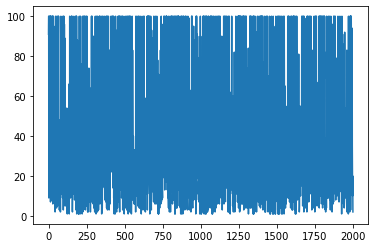

In [15]:
plt.plot(steps)

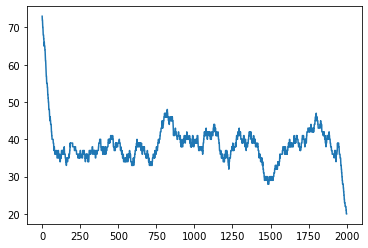

In [16]:
from scipy.ndimage import uniform_filter1d
smoothed_steps = uniform_filter1d(steps,size=100,mode='nearest')
plt.plot(smoothed_steps)